# データの確認 / テーブルの作成

## 背景と目的

- パーツに不具合があった場合、3年以内であればワランティが適用され、無償で交換対応を行っている。
- ワランティ数が増えてきた場合には、費用を投じて鋳型を再作成し、不具合に対応することもあるが、その場合は鋳型の作成費用がかかる。
- 各モデル/各パーツの将来のワランティ数推移を予測し、鋳型を再作成すべきかどうかの意思決定を合理的に行い、利益の最大化を図りたい。

## 本プロジェクトの対象範囲(スコープ)

- 国内で生産された四輪/二輪車の一部のモデルの一部のパーツについて、1,3,6,12ヶ月後の月間ワランティ発生数を予測する。
    - 生産拠点コードが100100であるものを"国内で生産された"ものとする。
- モデル区分がAであるものを二輪, Bであるものを四輪とする。
- ワランティのFAILURE_DATEを故障日とし、"ワランティ発生時点"とする。ある月のうちに発生したワランティの総数を"月間ワランティ発生数"とする。
- 対象とするモデル及びパーツについては、以下の通り。
    - テラデータ(主担当: 眞田)が着手し、解説するもの
        - **四輪のパーツ-モデル組み合わせ上位100件**
    - スズキ様(主担当: 平岡様)が着手し、テラデータ(主担当: 眞田)が補助するもの
        - **二輪のパーツ-モデル組み合わせ上位100件**

- 目的(鋳型を再作成すべきか否かと意思決定)を達成するには、今回のスコープである将来のワランティ発生数推移の他に、1.各ワランティの対応費用及び2.鋳型の作成費用、3.新しい鋳型で作成されたパーツの将来のワランティ発生数推移を知る必要がある。これらについては本プロジェクトの**対象範囲外**とする。(9月末までに時間が余ったら着手)
    - もしこれらについても分析を行うとすれば、以下のようなアプローチが考えられる
        - 1.ワランティ対応費用
            - <font color='green'>簡単</font>: 単に過去平均を取る
            - <font color='blue'>普通</font>: 似たパーツ、似たモデルについては似たようなコストがかかる / 初回発生から回数や時間を経たものについては費用が下がる という仮定を置いて、費用についての回帰モデルを作成する
        - 2.鋳型の作成費用
            - <font color='green'>簡単</font>: 鋳型作成担当者に聞く
            - <font color='green'>簡単</font>: 過去の鋳型作成費用の平均を取る
            - <font color='blue'>普通</font>: 似たパーツ、似たモデルについては似たようなコストがかかるという仮定を置いて、費用についての回帰モデルを作成する
        - 3.新しい鋳型で作成されたパーツ(=新パーツ)の将来のワランティ発生数推移
            - <font color='green'>簡単</font>: 不具合対応前と後でのワランティ発生数の比率を過去データから計算し、通常時のワランティ発生数予測にその比率を掛け合わせ計算する
            - <font color='blue'>普通</font>: 今回の分析で行うワランティ発生数予測と同様の分析を、不具合対応で再作成されたパーツのみに限定して行う
            - <font color='purple'>複雑</font>: 今回の分析で行うワランティ発生数予測について、不具合対応前か後かのフラグも説明変数に加えてモデルを構成し、作成されたモデルをもとに不具合対応後のワランティ発生数を予測する。
    - 上記の情報の元で$\sum_{t}^{\infty}(ワランティ発生数)_{t} * (ワランティ対応費用)_{t} - (鋳型作成費用) - \sum_{t}^{\infty}(新パーツのワランティ発生数)_{t} * (新パーツのワランティ対応費用)_{t}$を計算し、正であれば鋳型を作成し、負であれば鋳型は作成しない

## データ確認

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
from sqlalchemy.orm import sessionmaker
from sqlalchemy.ext.automap import automap_base
from sqlalchemy import create_engine, func, MetaData
from contextlib import closing
import pathlib
import pandas as pd

In [3]:
PATH_INTERIM_DATA = pathlib.Path("../data/interim/")

In [4]:
PATH_DB = pathlib.Path("../data/interim/suzuki_phase2_db.sqlite3")
engine = create_engine(f'sqlite:///{PATH_DB.resolve().as_posix()}')
Base = automap_base()
Base.prepare(engine, reflect=True)
Session = sessionmaker(bind=engine)
meta = MetaData(engine).reflect()

Tbhaa = Base.classes["tbhaa_all"]
Dbhaa = Base.classes["dbhaa_all"]

In [21]:
%%time
# random sample (時間がかかる。Teradataだと一瞬だが...)
with closing(Session()) as s:
    df_froc = pd.read_sql(s.query(Tbhaa).order_by(func.random())\
                             .limit(500_000).statement,s.bind)
    df_process = pd.read_sql(
        s.query(Dbhaa)
        .filter(Dbhaa.W_FIELD_CLAIM_DIV == "1")
        .order_by(func.random())
        .limit(500_000).statement,s.bind)

CPU times: user 1min 18s, sys: 2min 8s, total: 3min 27s
Wall time: 5min 1s


In [22]:
# featherフォーマットに保存。圧縮率は低いが、極めて高速に読み込むことができて便利。
# 書き出しには時間がかかる。50秒くらい。
# df_froc.to_feather(PATH_INTERIM_DATA/"tbhaa_all_random_500_000.feather")
df_process.to_feather(PATH_INTERIM_DATA/"dbhaa_all_random_500_000_1only.feather")

In [5]:
import pandas as pd
PATH_INTERIM_DATA = pathlib.Path("../data/interim/")
df_fcok = pd.read_feather(PATH_INTERIM_DATA/"tbhaa_all_random_500_000.feather")
df_process = pd.read_feather(PATH_INTERIM_DATA/"dbhaa_all_random_500_000_1only.feather")

/Users/localadmin/anaconda3/envs/suzuki/lib/python3.6/site-packages/pyarrow/pandas_compat.py:752: FutureWarning: .labels was deprecated in version 0.24.0. Use .codes instead.
  labels, = index.labels


In [6]:
def pieplot_topN(series, n, other_label="other", savepath=None, 
                 title=None, **kwargs):
    series = series.sort_values(ascending=False)
    top = series[:n]
    top[other_label] = series[n:].sum()
    ax = plt.pie(top, labels=top.index, **kwargs)
    if title: plt.title(title)
    if savepath: plt.savefig(savepath)
    plt.show()

======ワランティ======


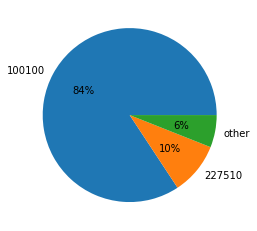

======生産======


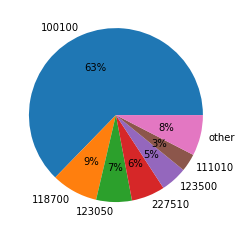

In [7]:
import matplotlib.pyplot as plt
print("======ワランティ======")
pieplot_topN(df_process.W_PROD_BASE_CD.value_counts() / df_process.shape[0],2,
            autopct='%1.f%%')
print("======生産======")
pieplot_topN(df_fcok.V_BASE_CD.value_counts() / df_fcok.shape[0],6,
            autopct='%1.f%%')

======ワランティ(処理拠点)======


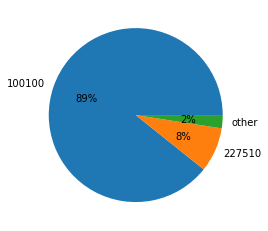

In [8]:
print("======ワランティ(処理拠点)======")
pieplot_topN(df_process.W_BASE_CD.value_counts() / df_process.shape[0],2,
            autopct='%1.f%%')

ワランティデータは国内生産が84%(処理拠点ベースでは89%)。国内生産のモデルのワランティデータに絞って取り組む。

======ワランティ======


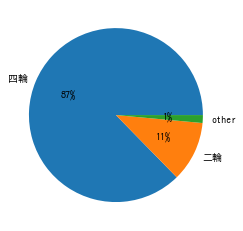

======生産======


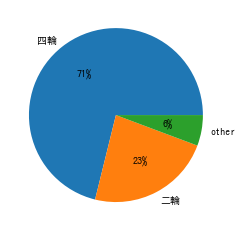

In [9]:
plt.rcParams["font.family"] = "IPAGothic"
PATH_REPORT = pathlib.Path("../reports/")
tmp = ((df_process[df_process.W_PROD_BASE_CD == "100100"]
       .W_PROD_DIV.value_counts() / df_process.shape[0] * 100)
       .sort_values(ascending=False)
       .rename({"A":"二輪","B":"四輪","C":"船外機","D":"発電機", "E":"ポンプ",
            "F":"OEM","G":"電動車両"}))
print("======ワランティ======")
pieplot_topN(tmp, 2, autopct='%1.f%%')
tmp_fcok = ((df_fcok[df_fcok.V_BASE_CD == "100100"]
       .V_PROD_DIV.value_counts() / df_fcok.shape[0] * 100)
       .sort_values(ascending=False)
       .rename({"A":"二輪","B":"四輪","C":"船外機","D":"発電機", "E":"ポンプ",
            "F":"OEM","G":"電動車両"}))
print("======生産======")
pieplot_topN(tmp_fcok, 2, autopct='%1.f%%')

四輪と二輪が大半。四輪と二輪に限定して取り組む。

In [12]:
%%time
# 生産データのカバー率。少なくとも、全てのワランティはカバーされている部品で分析を行いたい。
# 四輪と二輪、国内生産、FIELD_CLAIM_DIVは1に限定
with closing(Session()) as s:
    df_cover_ratio = pd.read_sql(
        s.query(Dbhaa.W_PROD_MODEL_CD
               ,Dbhaa.W_CAUSAL_PART_NO
               ,func.count("*").label("n_w")
               ,func.count(Tbhaa.V_VIN).label("n_v"))
        .outerjoin(Tbhaa, Dbhaa.W_VIN == Tbhaa.V_VIN)
        .filter(Dbhaa.W_FIELD_CLAIM_DIV == "1",
               Dbhaa.W_PROD_BASE_CD == "100100",
               Dbhaa.W_PROD_DIV.in_(["B"]))
        .group_by(Dbhaa.W_PROD_MODEL_CD,
                 Dbhaa.W_CAUSAL_PART_NO)
        .statement, s.bind)

CPU times: user 1min 49s, sys: 58.6 s, total: 2min 47s
Wall time: 3min 40s


In [10]:
PATH_PROCESSED = pathlib.Path("../reports/")

In [36]:
df_cover_ratio["coverage"] = df_cover_ratio["n_v"] / df_cover_ratio["n_w"]
df_cover_ratio.to_csv(PATH_PROCESSED/"fcok_cover_ratio.csv", index=False)

In [11]:
df_cover_ratio = pd.read_csv(PATH_PROCESSED/"fcok_cover_ratio.csv")

In [38]:
df_cover_ratio.sort_values(by="n_v", ascending=False).head()

,W_PROD_MODEL_CD,W_CAUSAL_PART_NO,n_w,n_v,coverage
309339,Y8WW2,37190-52D21,8465,8465,1.000000
222647,XC021,21501-05H00,7577,7464,0.985086
222649,XC021,21501-05H01,7091,6957,0.981103
1016069,YJ0F3B72,39101-78A90,6737,6737,1.000000
1642376,YT4F5,17521-54L31,6265,6265,1.000000


In [39]:
df_cover_ratio.shape, df_cover_ratio[df_cover_ratio.coverage == 1].shape

((1752404, 5), (1650466, 5))

殆どのパーツについては、生産データの方に情報がある(カバーされている）

In [9]:
# パーツでグループして、複数のモデルに含まれるパーツがあるかチェック
df_n_model_same_parts = df_cover_ratio.groupby("W_CAUSAL_PART_NO")["n_w"]\
        .agg({"n_model_same_parts":len})
df_n_model_same_parts.iloc[:,0].sort_values(ascending=False).head()

/Users/localadmin/anaconda3/envs/suzuki/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version
  This is separate from the ipykernel package so we can avoid doing imports until


W_CAUSAL_PART_NO
43440-84F00    1710
12761-73G01    1672
38860-76F01    1645
74150-76G00    1525
18640-78G00    1498
Name: n_model_same_parts, dtype: int64

同じパーツが複数のモデルに使用されるケースも多い。

In [42]:
%%time

# モデルコード、パーツコードを上3(二輪は4桁), 上5-3桁に絞って集計
from sqlalchemy import case

with closing(Session()) as s:
    df_cover_ratio_gathered = pd.read_sql(
        s.query(case([(Dbhaa.W_PROD_DIV == "A", func.substr(Dbhaa.W_PROD_MODEL_CD, 1, 4))
                      ,(Dbhaa.W_PROD_DIV == "B", func.substr(Dbhaa.W_PROD_MODEL_CD, 1, 3))]
                     ,else_=Dbhaa.W_PROD_MODEL_CD).label("MODEL_CD") 
               ,func.substr(Dbhaa.W_CAUSAL_PART_NO, 1, 9).label("CAUSAL_PART")
               ,func.count("*").label("n_w")
               ,func.count(Tbhaa.V_VIN).label("n_v"))
        .outerjoin(Tbhaa, Dbhaa.W_VIN == Tbhaa.V_VIN)
        .filter(Dbhaa.W_FIELD_CLAIM_DIV == "1", 
                Dbhaa.W_PROD_DIV.in_(["A","B"]),
                Dbhaa.W_PROD_BASE_CD == "100100"
               )
        .group_by("MODEL_CD",
                 "CAUSAL_PART")
        .statement, s.bind)

CPU times: user 1min 58s, sys: 1min 26s, total: 3min 25s
Wall time: 5min 11s


In [43]:
df_cover_ratio_gathered["coverage"] = df_cover_ratio_gathered["n_v"] \
    / df_cover_ratio_gathered["n_w"]

In [44]:
df_cover_ratio_gathered.to_csv(PATH_PROCESSED/"cover_ratio_gathered.csv",
                              index=False)

In [137]:
PATH_PROCESSED = pathlib.Path("../data/processed")

In [138]:
df_cover_ratio_gathered = pd.read_csv(PATH_PROCESSED/"cover_ratio_gathered.csv")

FileNotFoundError: [Errno 2] File b'../data/processed/cover_ratio_gathered.csv' does not exist: b'../data/processed/cover_ratio_gathered.csv'

In [48]:
df_cover_ratio_gathered.shape, \
    df_cover_ratio_gathered[df_cover_ratio_gathered.coverage==1].shape

((217334, 5), (162766, 5))

十分の一くらいになった

In [49]:
df_cover_ratio_gathered.sort_values(by="n_w", ascending=False).head()

,MODEL_CD,CAUSAL_PART,n_w,n_v,coverage
153926,YJ0,27610-76G,123698,123560,0.998884
179600,YP0,27610-76G,64038,63964,0.998844
130842,YG0,84701-70K,62105,62105,1.000000
131036,YG0,95411-82K,56865,56865,1.000000
144363,YH4,82850-65D,48728,48710,0.999631


In [11]:
PATH_RAW = pathlib.Path("../data/raw/")
hinmei = pd.read_csv(PATH_RAW/"warranty_fcok"/"fa0010.csv", encoding="CP932")
hinmei.head() # パーツコードの読み替え表

,H_HINBAN,H_MATTAN,H_NAME,H_HINMEI
0,*1120-CA121,5766,,ｸﾗﾝｸｹｰｽ､ｸﾗﾝｸｼﾔﾌﾄ､
1,*1120-CA211,5766,,ｸﾗﾝｸｹｰｽ､ｸﾗﾝｸｼﾔﾌﾄ､
2,*1120-CA4AA,716,,ｸﾗﾝｸｹｰｽ､ｸﾗﾝｸｼﾔﾌﾄ､
3,*1120-CA4BA,716,,ｸﾗﾝｸｹｰｽ､ｸﾗﾝｸｼﾔﾌﾄ､
4,*1120-CA41A,806,,ｸﾗﾝｸｹｰｽ､ｸﾗﾝｸｼﾔﾌﾄ､


In [139]:
df_warranty_model_part_num_monthly.head()

,PROD_CD,PART_CD,MONTH,N
0,NaN,*0000-000,200301,1
1,NaN,*1110-CT5,200006,1
2,NaN,*1110-CT5,200107,1
3,NaN,*1110-DC5,200101,1
4,NaN,*1110-MA6,200002,1


In [142]:
# パーツコードマスタを作成。どの主原因品番がどのモデルに含まれているのかの読み替え表を作成

df_part_model_master = (df_warranty_model_part_num_monthly[["PART_CD", "PROD_CD"]]
                       .set_index(["PART_CD", "PROD_CD"])
                       .sort_index().reset_index()
                       .dropna())

In [146]:
df_part_model_master.tail(10)

,PART_CD,PROD_CD
2529178,M9103-061,YH4
2529179,M9103-061,YH4
2529180,M9168-140,YE9
2529181,M9168-140,YH4
2529182,M9241-250,YH4
2529183,M9241-250,YH4
2529185,M9246-100,YE9
2529186,M9246-200,YH4
2529191,M9401-240,YH4
2529192,M9402-065,YH4


In [13]:
from collections import defaultdict
part_model_master = defaultdict(list)

for _, row in df_part_model_master.iterrows():
    part_model_master[row["CAUSAL_PART"]].append(row["MODEL_CD"])

In [14]:
part_model_master["*1110-CT5"]

['YC0']

In [ ]:
df_part

In [21]:
%%time

# 通期(データ全体)で見た場合の、モデル毎の月毎の生産数を確認
# モデルコードを上3(二輪は4桁)に絞って集計
# 国内で生産された四輪、二輪に限定。

with closing(Session()) as s:
    df_fcok_model_num_monthly = pd.read_sql(
        """
        select
            case 
                when V_PROD_DIV = "A" then substr(V_PROD_MODEL_CD, 1, 4)
                when V_PROD_DIV = "B" then substr(V_PROD_MODEL_CD, 1, 3)
            else V_PROD_MODEL_CD
            end as PROD_CD
            ,substr(V_FCOK, 1,6) as MONTH
            ,count(*) as N 
        from
            tbhaa_all
        where
            V_BASE_CD = "100100"
            and V_PROD_DIV in ("A", "B")
        group by
            PROD_CD, MONTH;
        """
        , s.bind)

CPU times: user 37.5 s, sys: 21.2 s, total: 58.8 s
Wall time: 2min 2s


In [28]:
print(df_fcok_model_num_monthly.shape)
print(df_fcok_model_num_monthly.N.sum())
df_fcok_model_num_monthly.head()

(18286, 3)
27724386


,PROD_CD,MONTH,N
0,None,200105,9
1,None,200106,108
2,None,200107,44
3,None,200108,42
4,None,200109,91


In [66]:
df_fcok_model_num_monthly\
    .to_csv(PATH_INTERIM_DATA/"df_fcok_model_num_monthly.csv", index=False)

In [95]:
df_fcok_model_num_monthly = pd.read_csv(PATH_INTERIM_DATA/"df_fcok_model_num_monthly.csv")

In [31]:
%%time

# 通期(データ全体)で見た場合の、モデル x パーツ x 月毎のワランティ数を確認
# モデルコードを上3(二輪は4桁)に絞って集計
# 国内で生産された四輪、二輪に限定。

with closing(Session()) as s:
    df_warranty_model_part_num_monthly = pd.read_sql(
        """
        select
            case 
                when W_PROD_DIV = "A" then substr(W_PROD_MODEL_CD, 1, 4)
                when W_PROD_DIV = "B" then substr(W_PROD_MODEL_CD, 1, 3)
            else W_PROD_MODEL_CD
            end as PROD_CD
            ,substr(W_CAUSAL_PART_NO, 1, 9) as PART_CD
            ,substr(W_FAILURE_DATE, 1, 6) as MONTH
            ,count(*) as N 
        from
            dbhaa_all
        where
            W_PROD_BASE_CD = "100100"
            and W_PROD_DIV in ("A", "B")
        group by
            PROD_CD, PART_CD, MONTH;
        """
        , s.bind)

CPU times: user 42.4 s, sys: 12.3 s, total: 54.7 s
Wall time: 1min 13s


In [ ]:
df_warranty_model_part_num_monthly.to_csv(PATH_INTERIM_DATA/"df_warranty_model_part_num_monthly.csv",
                                         index=False)

In [4]:
df_warranty_model_part_num_monthly = \
    pd.read_csv(PATH_INTERIM_DATA/"df_warranty_model_part_num_monthly.csv")

/Users/localadmin/anaconda3/envs/suzuki/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [32]:
print(df_warranty_model_part_num_monthly.shape)
print(df_warranty_model_part_num_monthly.N.sum())
df_warranty_model_part_num_monthly.head()

(2529950, 4)
17016597


,PROD_CD,PART_CD,MONTH,N
0,None,*0000-000,200301,1
1,None,*1110-CT5,200006,1
2,None,*1110-CT5,200107,1
3,None,*1110-DC5,200101,1
4,None,*1110-MA6,200002,1


In [86]:
df_warranty_model_num_monthly = (df_warranty_model_part_num_monthly
       .fillna("!Unknown")
       .groupby(["PROD_CD", "MONTH"])["N"]
       .sum()
       .reset_index())

In [87]:
tmp = df_warranty_model_num_monthly.copy()
tmp["MONTH"] = pd.to_datetime(tmp["MONTH"].astype(str) + "01")
tmp = tmp.set_index("MONTH")

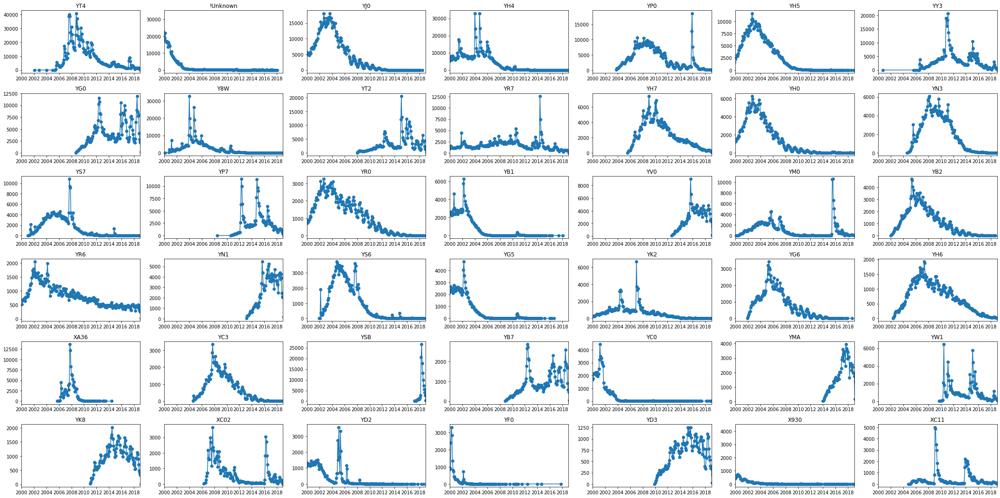

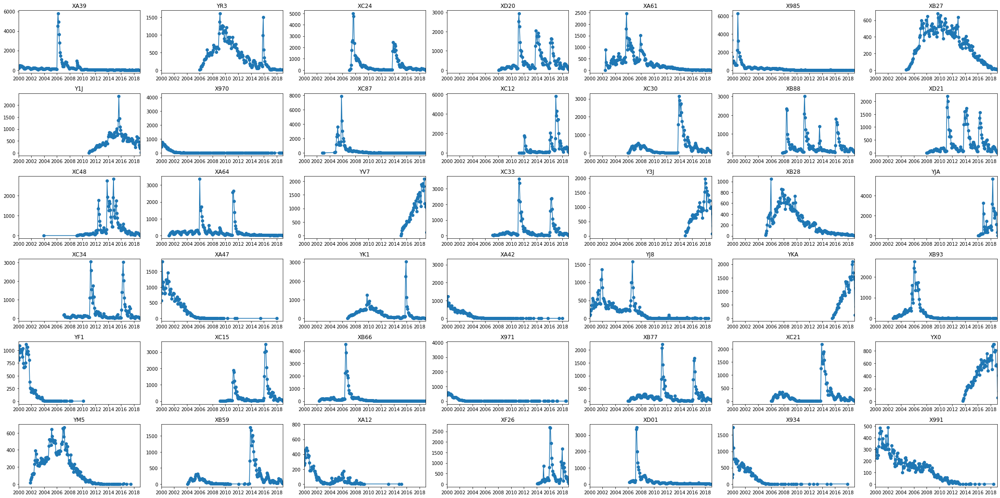

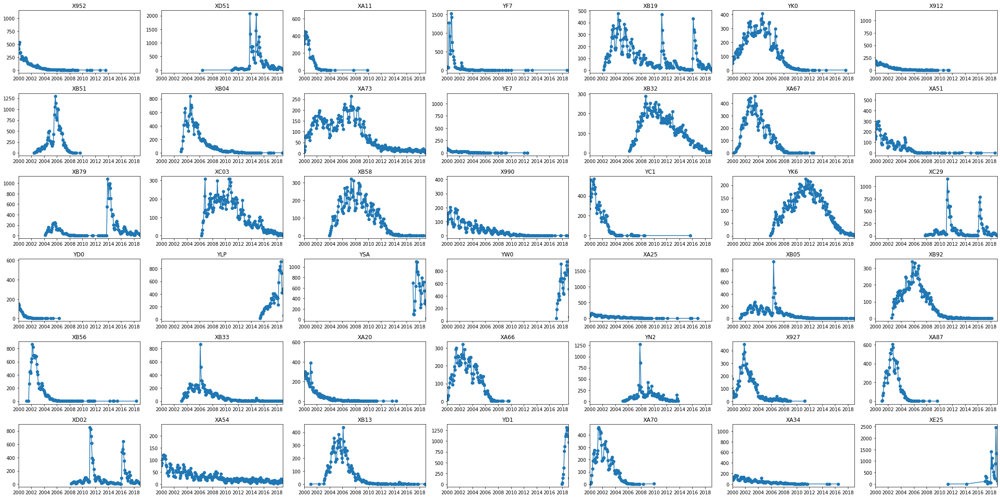

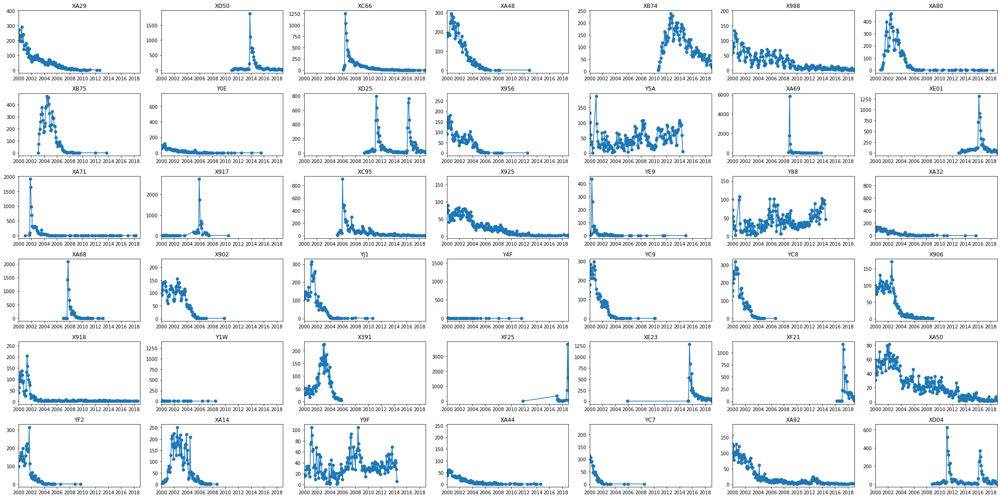

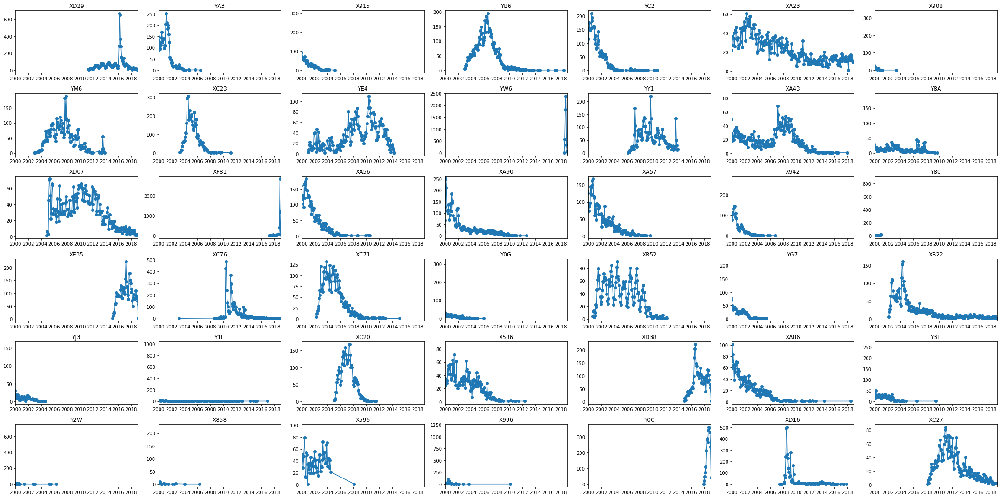

...

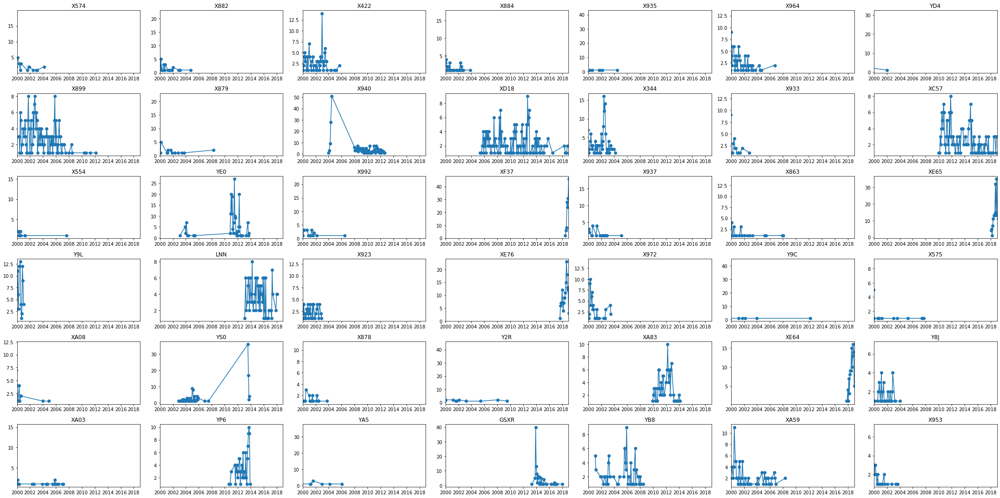

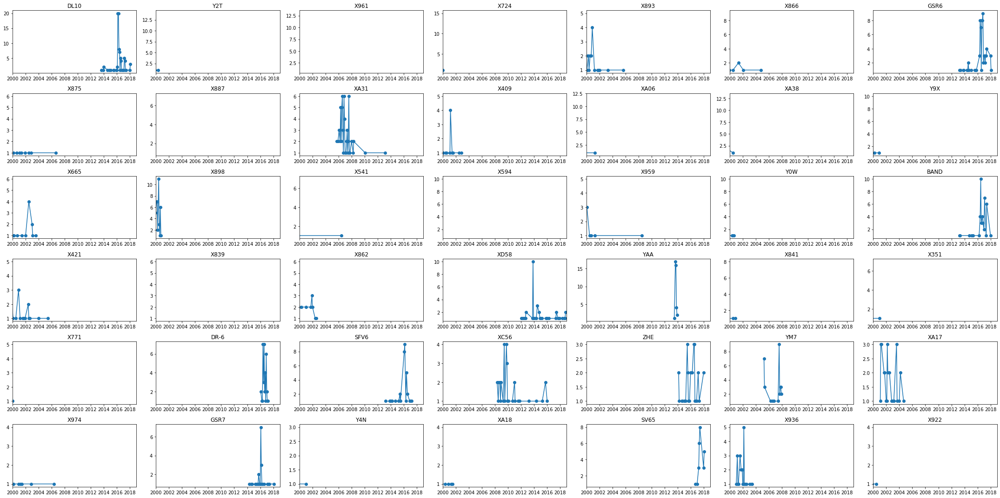

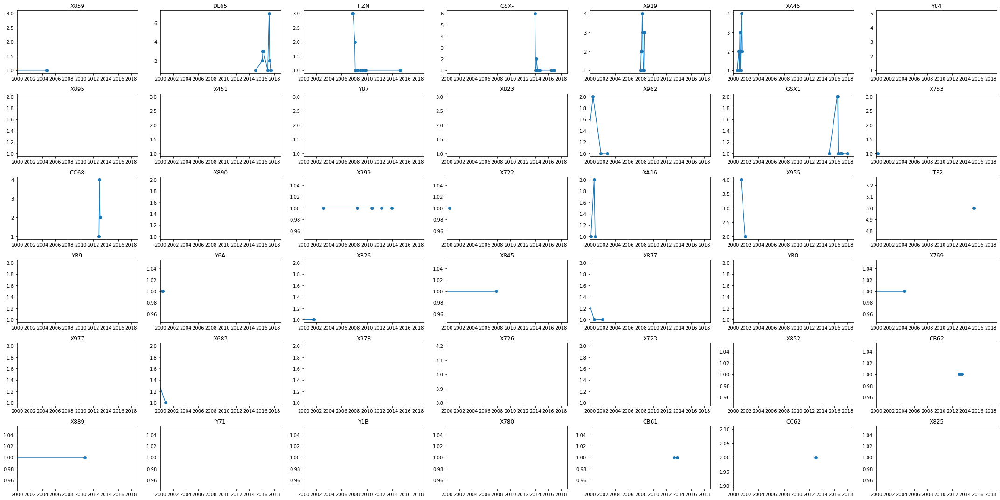

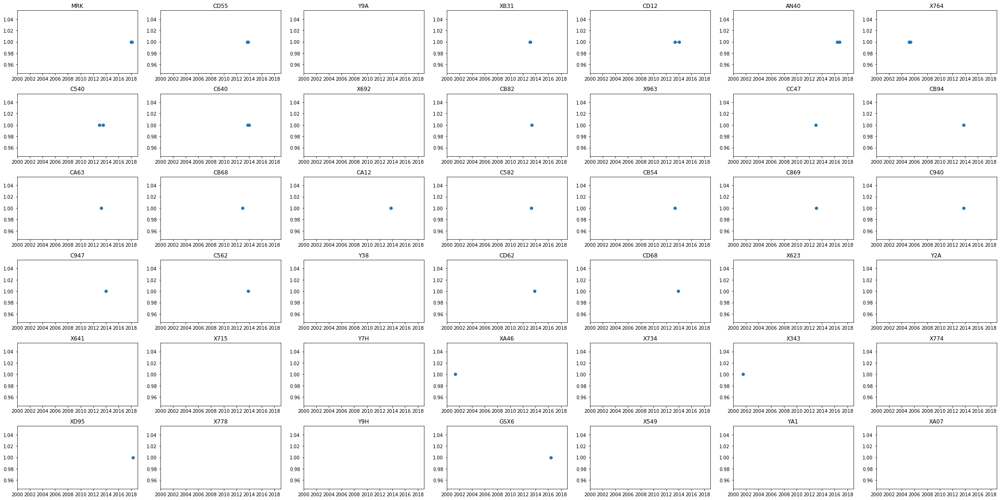

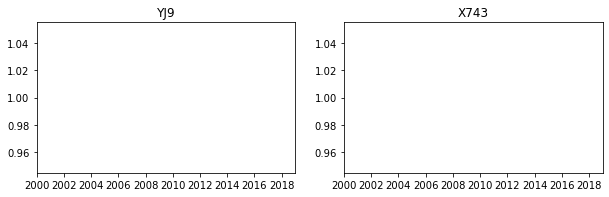

In [89]:
for k in range(0, len(model_top.index), 42):
    print("===" * 100)
    plt.figure(figsize=(30,15))
    for i, m in enumerate(model_top.index[k:k+42]):
        plt.subplot(6,7,i+1)
        val = tmp.loc[tmp.PROD_CD == m, "N"]
        plt.plot(val.index, val, "o-")
        plt.title(m)
        plt.xlim(datetime(2000,1,1),datetime(2018,12,31))
    plt.tight_layout()
    plt.show()

In [51]:
%%time

# 通期(データ全体)で見た場合の、モデル x パーツ x 経過月毎のワランティ数を確認
# モデルコードを上3(二輪は4桁)に絞って集計
# 国内で生産された四輪、二輪に限定。

with closing(Session()) as s:
    df_warranty_model_part_num_month_passed = pd.read_sql(
        """
        select
            case 
                when W_PROD_DIV = "A" then substr(W_PROD_MODEL_CD, 1, 4)
                when W_PROD_DIV = "B" then substr(W_PROD_MODEL_CD, 1, 3)
            else W_PROD_MODEL_CD
            end as PROD_CD
            ,substr(W_CAUSAL_PART_NO, 1, 9) as PART_CD
            ,W_SALES_TO_FAILURE as PASSED_MONTH
            ,count(*) as N 
        from
            dbhaa_all
        where
            W_PROD_BASE_CD = "100100"
            and W_PROD_DIV in ("A", "B")
        group by
            PROD_CD, PART_CD, PASSED_MONTH;
        """
        , s.bind)

CPU times: user 38.3 s, sys: 12.7 s, total: 51 s
Wall time: 1min 2s


In [52]:
df_warranty_model_part_num_month_passed.to_csv(PATH_INTERIM_DATA/"df_warranty_model_part_num_month_passed.csv",
                                         index=False)

In [55]:
df_warranty_model_num_month_passed = (df_warranty_model_part_num_month_passed
       .fillna("!Unknown")
       .groupby(["PROD_CD", "PASSED_MONTH"])["N"]
       .sum()
       .reset_index())

In [83]:
tmp = df_warranty_model_num_month_passed.copy()
tmp["PASSED_MONTH"] = tmp["PASSED_MONTH"].astype(int)
tmp = tmp.set_index("PASSED_MONTH")

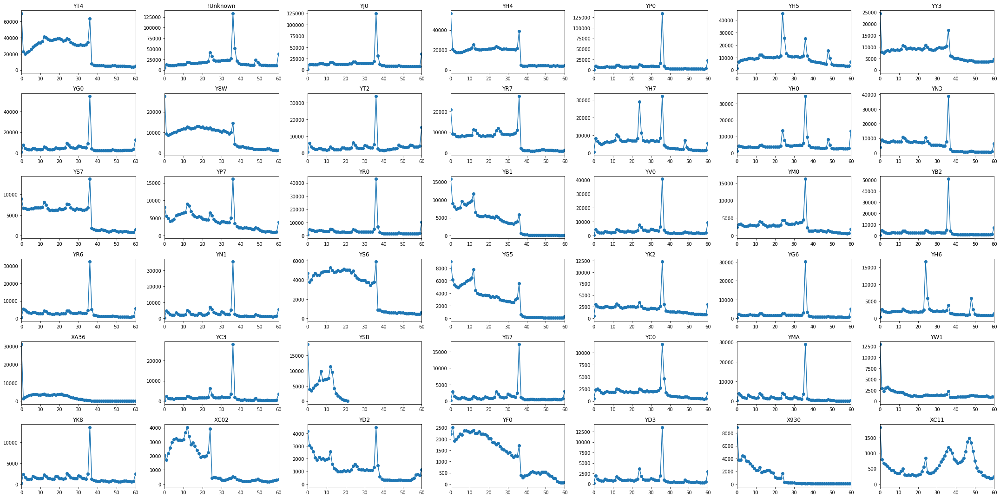

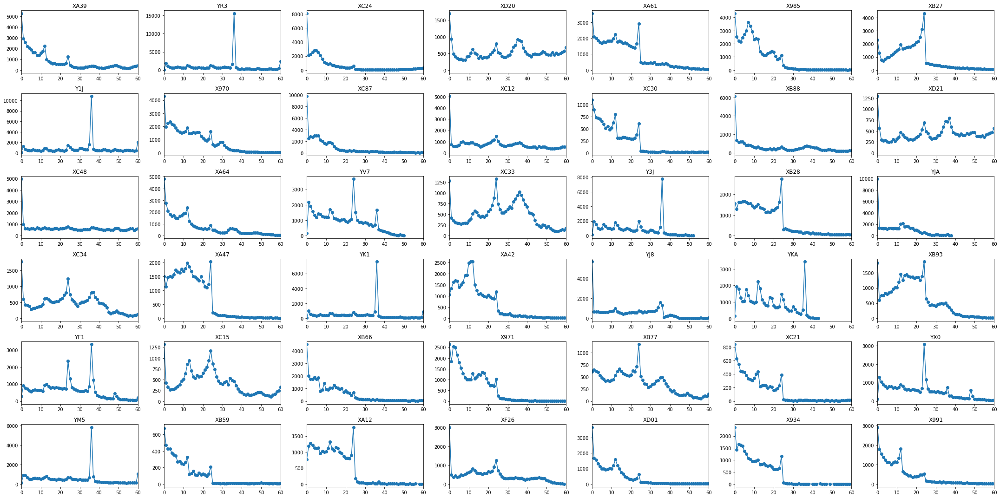

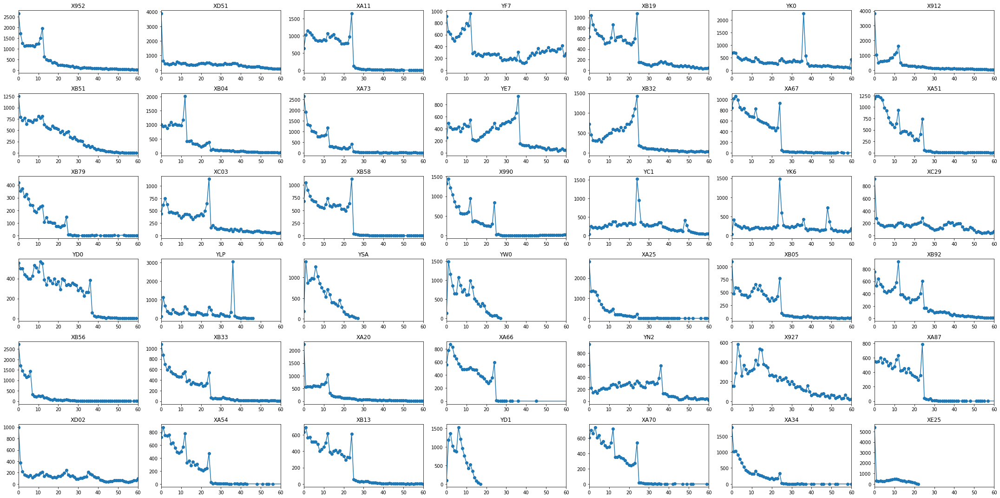

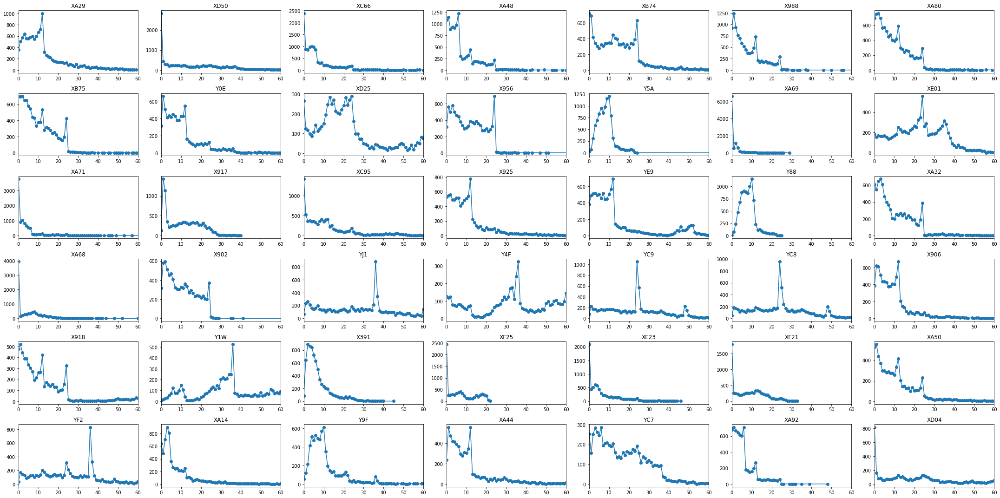

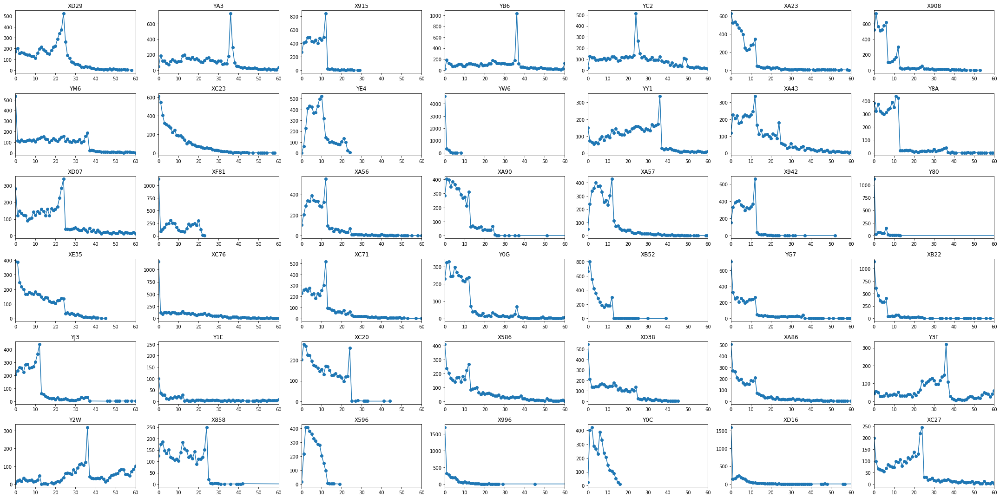

...

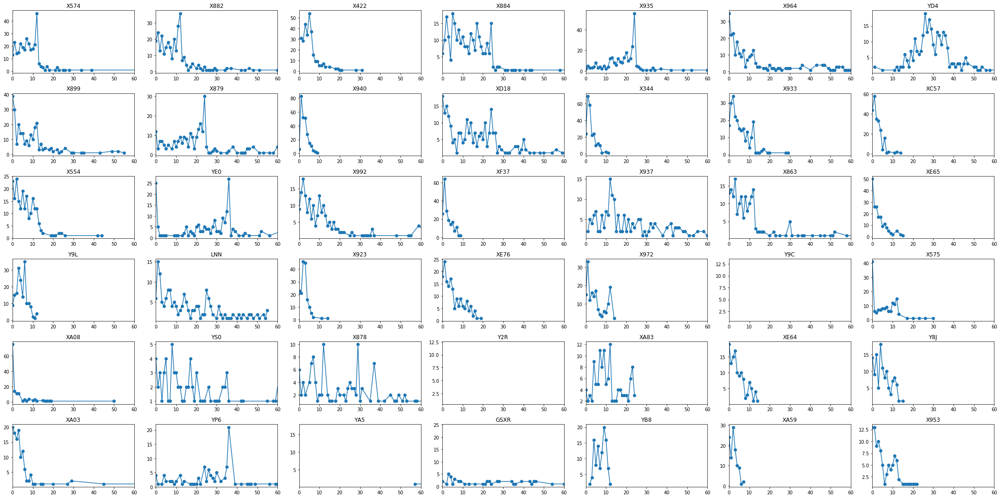

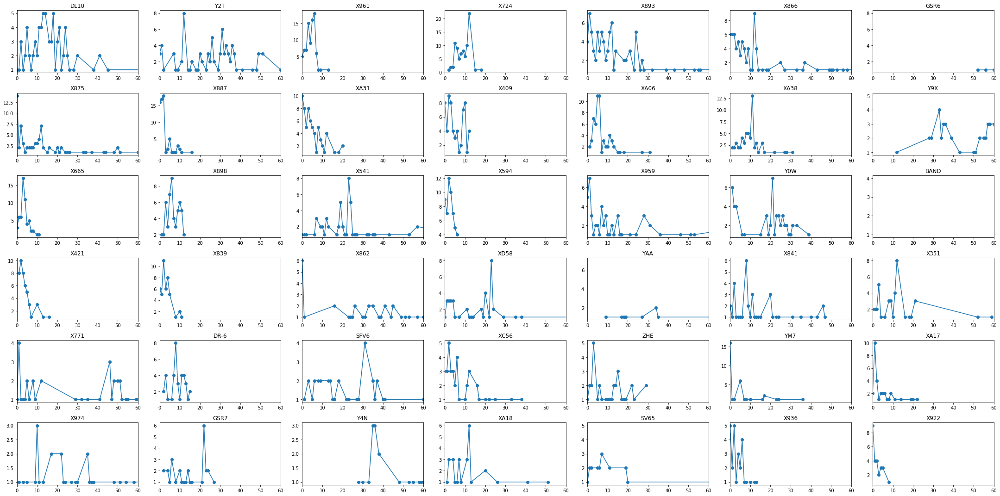

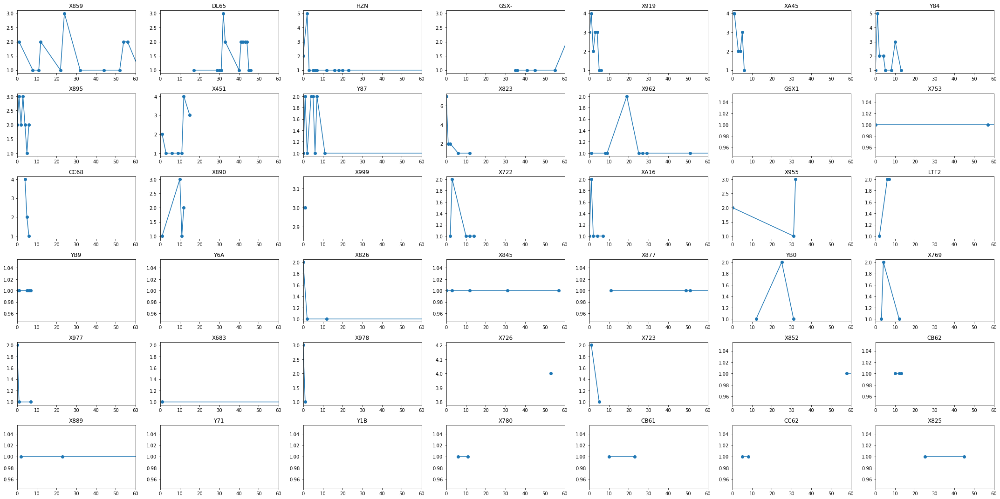

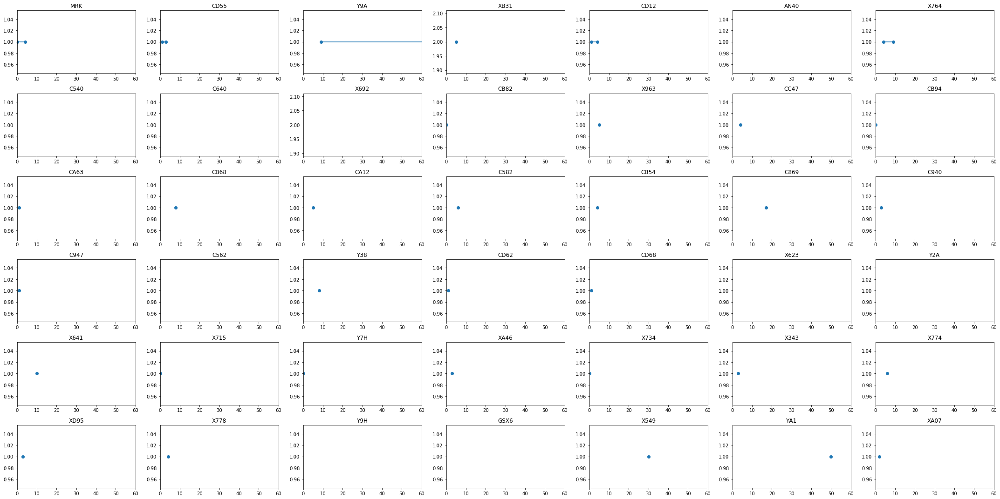

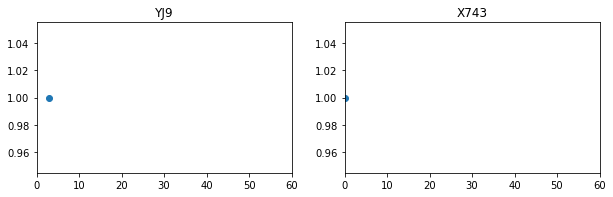

In [84]:
for k in range(0, len(model_top.index), 42):
    print("===" * 100)
    plt.figure(figsize=(30,15))
    for i, m in enumerate(model_top.index[k:k+42]):
        plt.subplot(6,7,i+1)
        val = tmp.loc[tmp.PROD_CD == m, "N"]
        plt.plot(val.index, val, "o-")
        plt.title(m)
        plt.xlim(0,60)
    plt.tight_layout()
    plt.show()

In [126]:
df_warranty_part_num_month_passed.head()

,PART_CD,PASSED_MONTH,N
0,*0000-000,1,3
1,*0000-000,2,3
2,*0000-000,3,2
3,*0000-000,4,3
4,*0000-000,5,1


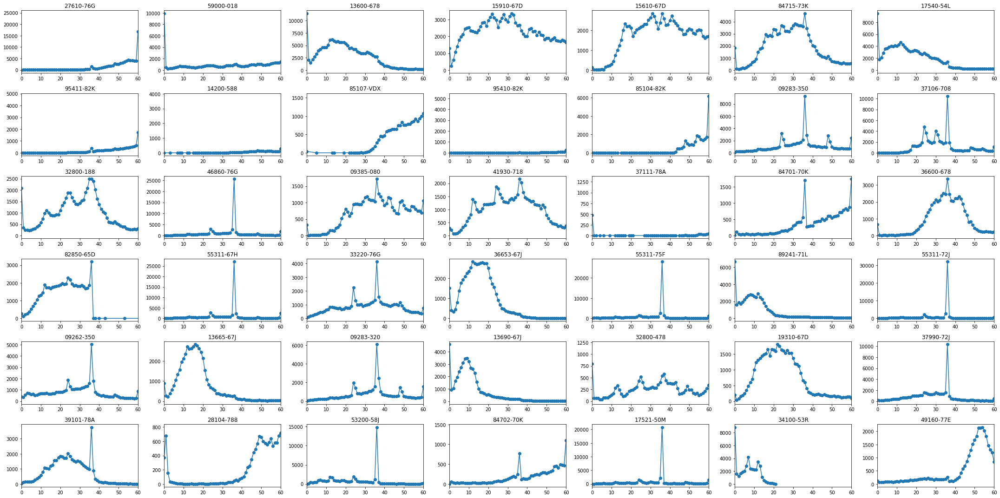

In [129]:
tmp = df_warranty_part_num_month_passed.copy()
tmp["PASSED_MONTH"] = tmp["PASSED_MONTH"].astype(int)
tmp = tmp.set_index("PASSED_MONTH")

k= 0
print("===" * 100)
plt.figure(figsize=(30,15))
for i, m in enumerate(parts_top.index[k:k+42]):
    plt.subplot(6,7,i+1)
    val = tmp.loc[tmp.PART_CD == m, "N"]
    plt.plot(val.index, val, "o-")
    plt.title(m)
    plt.xlim(0,60)
plt.tight_layout()
plt.show()

In [130]:
df_fcok_model_num_monthly.head()

,PROD_CD,MONTH,N
0,NaN,200105,9
1,NaN,200106,108
2,NaN,200107,44
3,NaN,200108,42
4,NaN,200109,91


In [132]:
df_fcok_model_num_running.head()

,PROD_CD,MONTH,N,running
0,!Unknown,200105,9,9
1,!Unknown,200106,108,117
2,!Unknown,200107,44,161
3,!Unknown,200108,42,203
4,!Unknown,200109,91,294


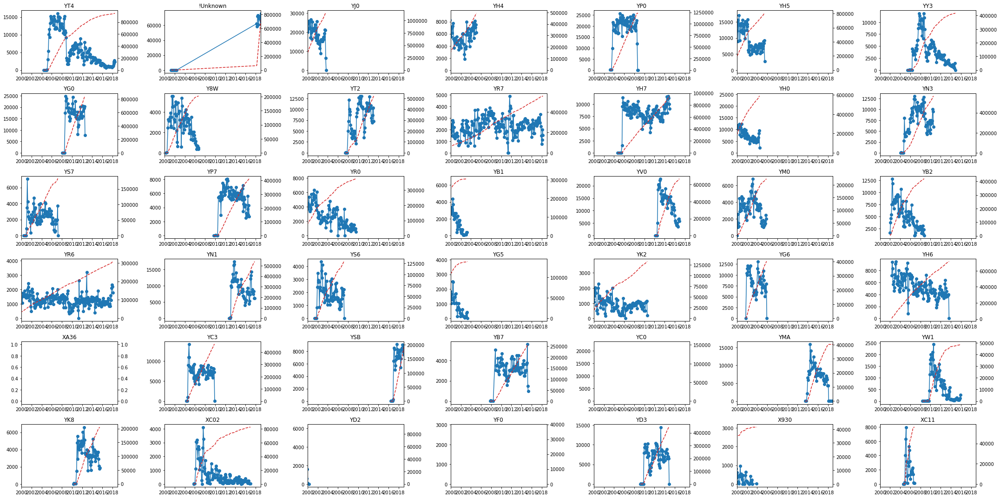

In [134]:
tmp = df_fcok_model_num_running.copy()
tmp["MONTH"] = pd.to_datetime(tmp["MONTH"].astype(str) + "01")
tmp = tmp.set_index("MONTH")

k= 0
print("===" * 100)
fig = plt.figure(figsize=(30,15))
for i, m in enumerate(model_top.index[k:k+42]):
    ax1 = fig.add_subplot(6,7,i+1)
    val1 = tmp.loc[tmp.PROD_CD == m, "N"]
    val2 = tmp.loc[tmp.PROD_CD == m, "running"]
    ax1.plot(val1.index, val1, "o-")
    ax1.set_title(m)
    ax1.set_xlim(datetime(2000,1,1),datetime(2018,12,31))
    
    ax2 = ax1.twinx()
    ax2.plot(val2.index, val2, "--", color="tab:red")
    ax2.set_xlim(datetime(2000,1,1),datetime(2018,12,31))
    
plt.tight_layout()
plt.show()

In [65]:
df_warranty_parts_num_monthly = (df_warranty_model_part_num_monthly
       .fillna("!Unknown")
       .groupby(["PART_CD", "MONTH"])["N"]
       .sum()
       .reset_index())

In [79]:
tmp = df_warranty_parts_num_monthly.copy()
tmp["MONTH"] = pd.to_datetime(tmp["MONTH"].astype(str) + "01")
tmp = tmp.set_index("MONTH")

In [68]:
parts_top = (df_warranty_parts_num_monthly
             .groupby("PART_CD")["N"]
             .sum()
             .sort_values(ascending=False))

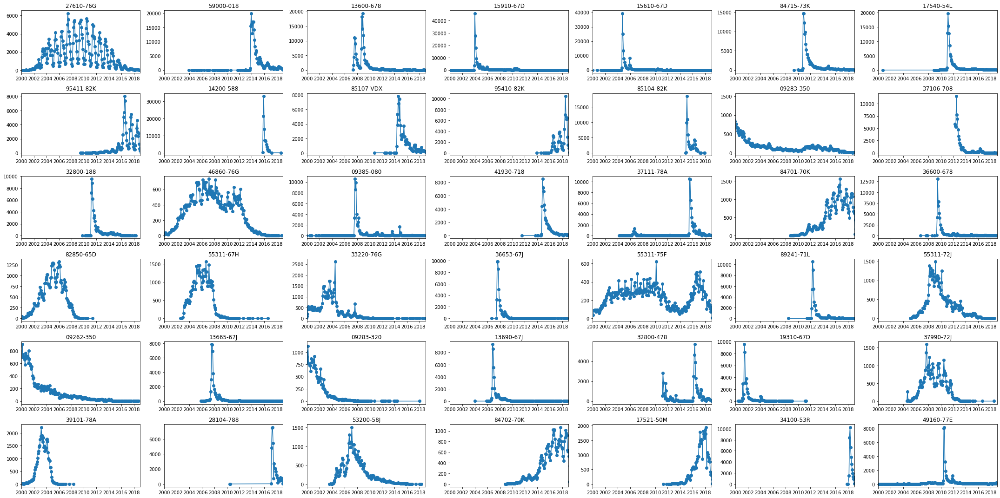

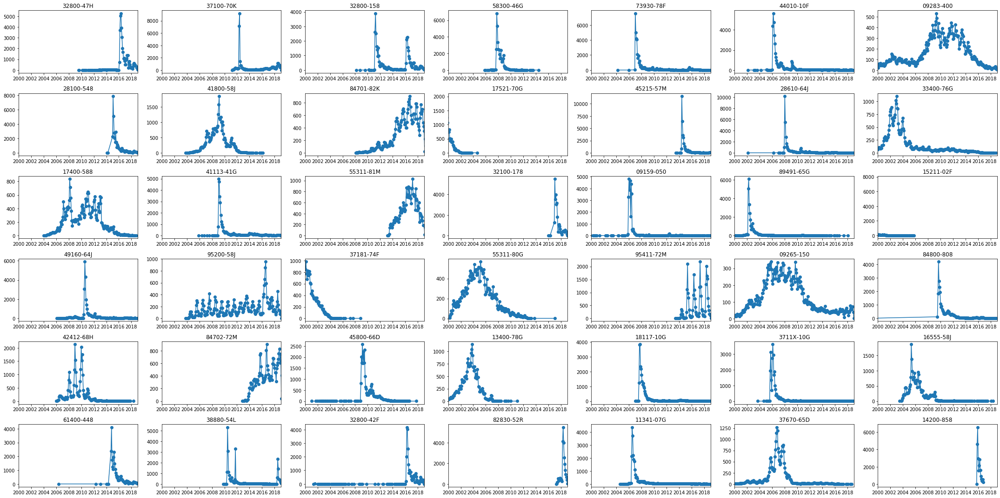

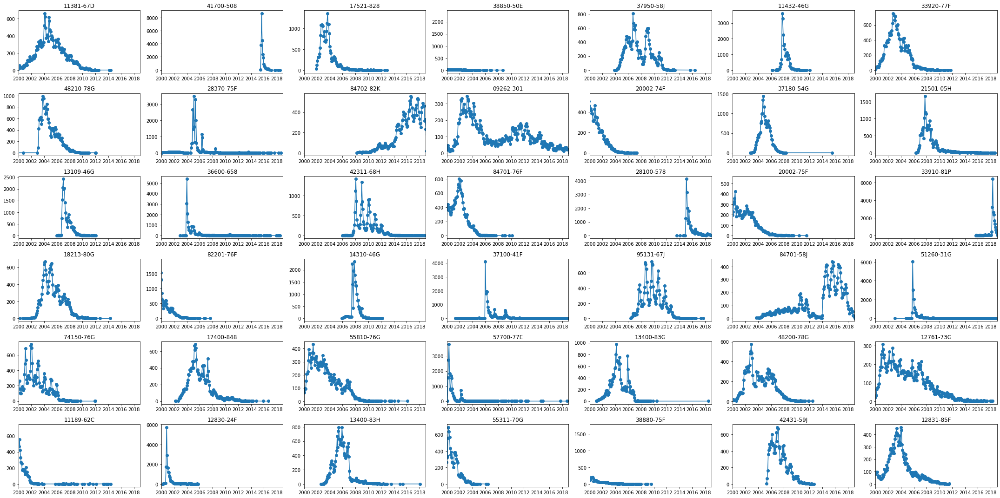

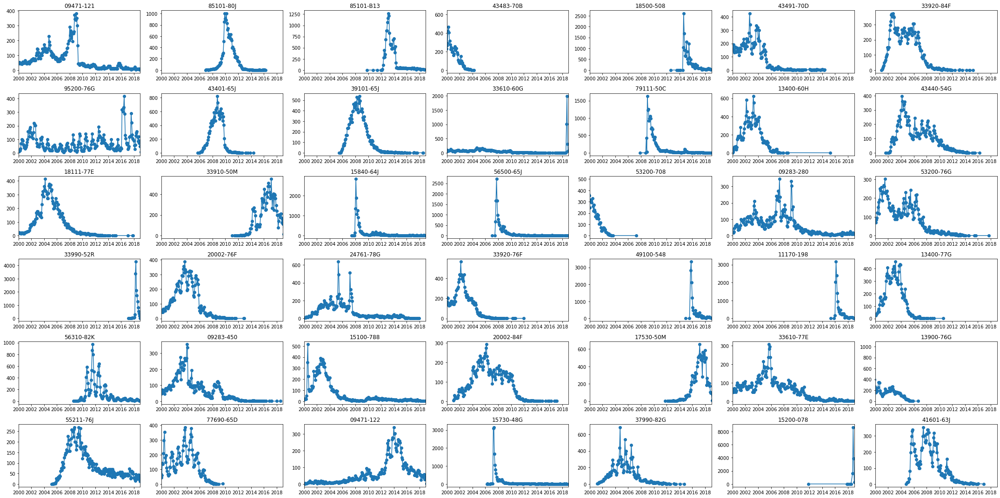

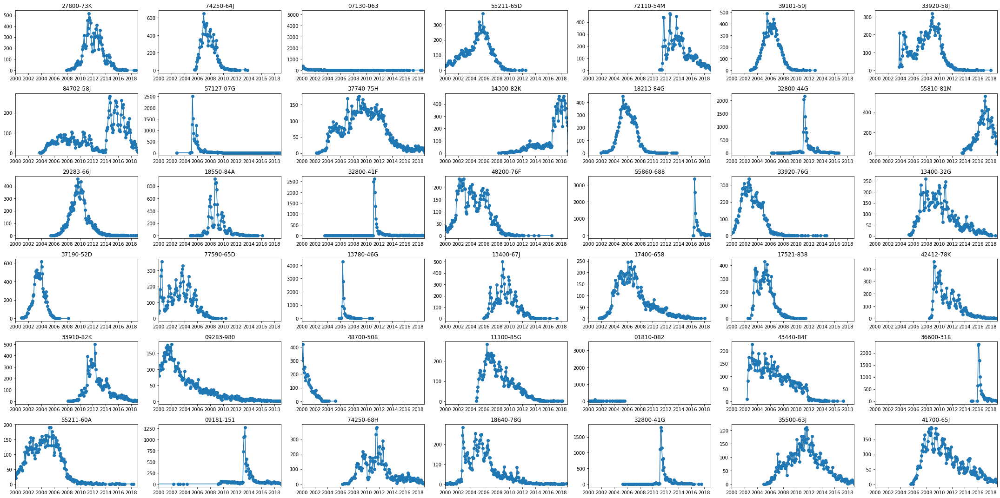

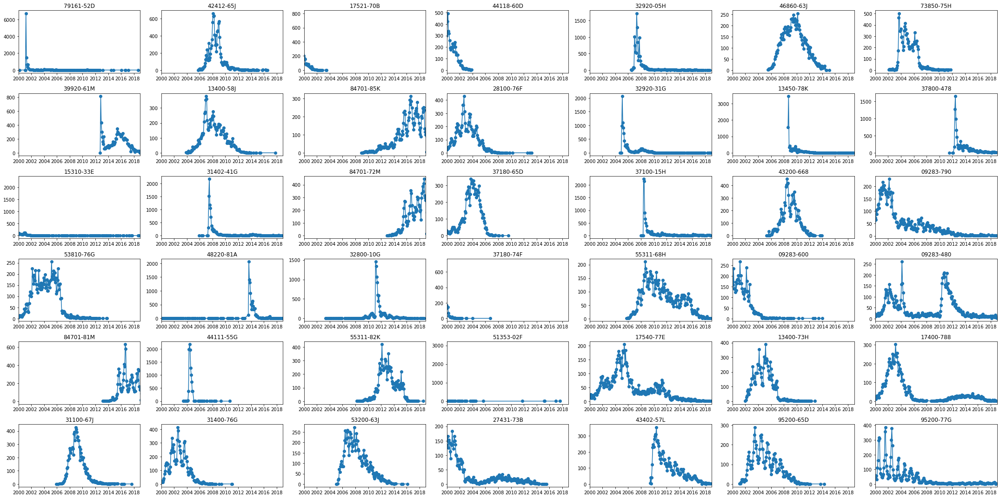

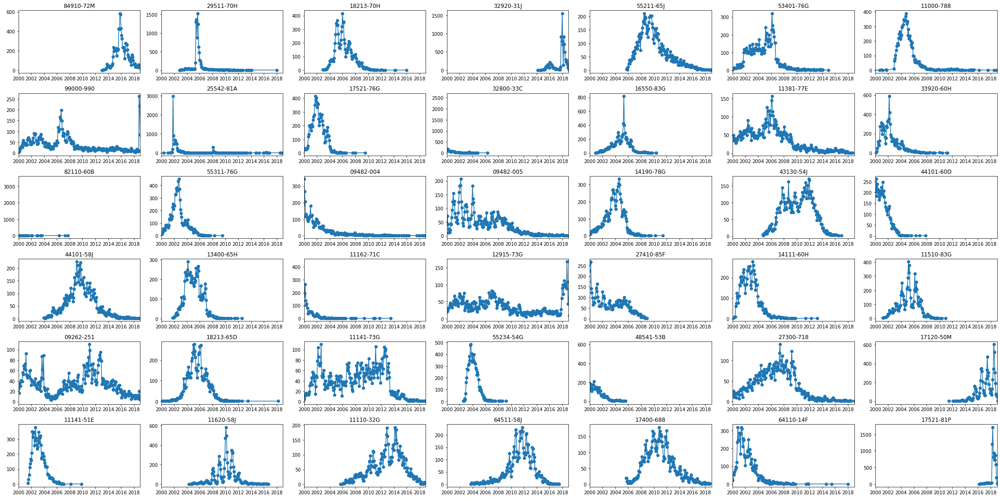

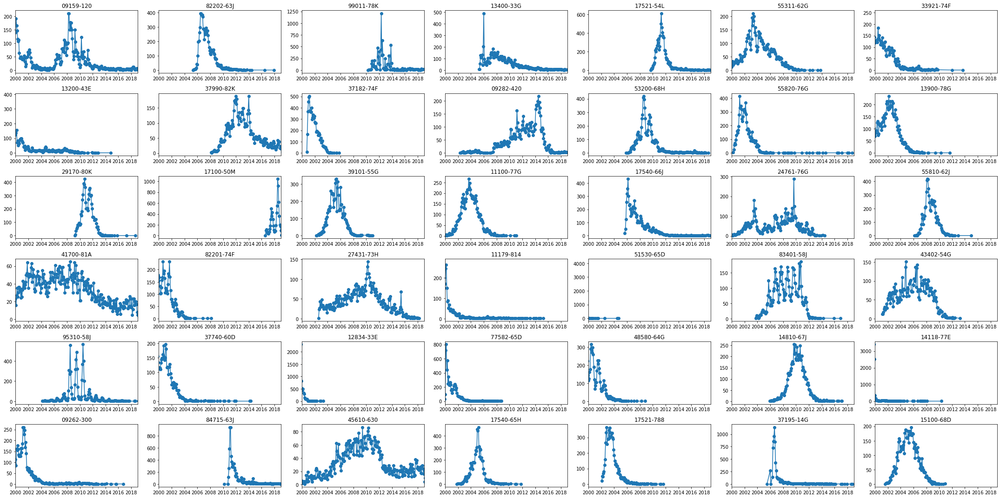

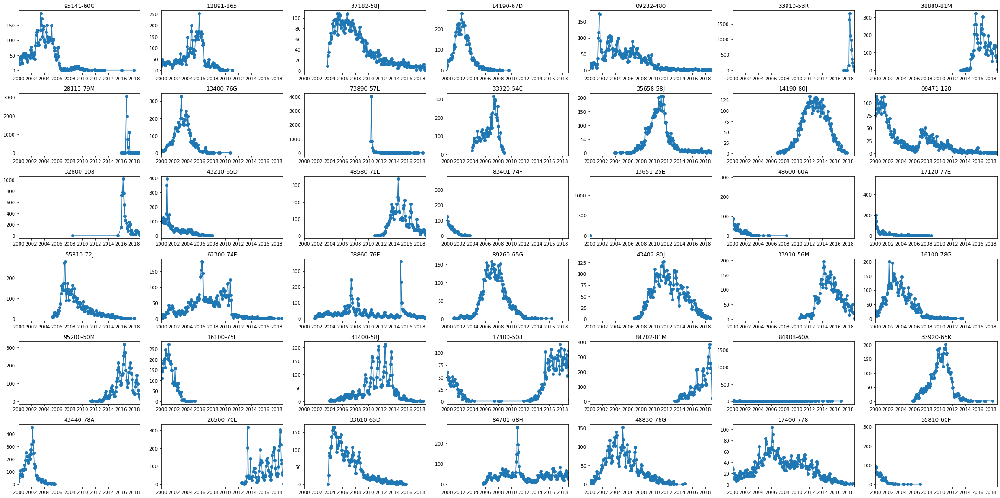

KeyboardInterrupt: 

In [81]:
for k in range(0, len(parts_top.index), 42):
    print("===" * 100)
    plt.figure(figsize=(30,15))
    for i, m in enumerate(parts_top.index[k:k+42]):
        plt.subplot(6,7,i+1)
        val = tmp.loc[tmp.PART_CD == m, "N"]
        plt.plot(val.index, val, "o-")
        plt.title(m)
        plt.xlim(datetime(2000,1,1),datetime(2018,12,31))
    plt.tight_layout()
    plt.show()

In [ ]:
df_warranty_model_num_monthly = (df_warranty_model_part_num_monthly
       .fillna("!Unknown")
       .groupby(["PROD_CD", "MONTH"])["N"]
       .sum()
       .reset_index())

In [ ]:
import matplotlib.pyplot as plt
from datetime import datetime

for k in range(0, len(model_top.index), 42):
    print("===" * 100)
    plt.figure(figsize=(30,15))
    for i, m in enumerate(model_top.index[k:k+42]):
        plt.subplot(6,7,i+1)
        val = tmp.loc[tmp.PROD_CD == m, "N"]
        plt.plot(val.index, val)
        plt.xlim(datetime(2000,1,1), datetime(2018,12,31))
        plt.title(m)
    plt.tight_layout()
    plt.show()

In [17]:
model_top100.head()

PROD_CD
YT4         1523322
!Unknown    1292361
YJ0         1011300
YH4          988412
YP0          676273
Name: N, dtype: int64

In [90]:
df_warranty_part_num_monthly = (df_warranty_model_part_num_monthly
       .fillna("!Unknown")
       .groupby(["PART_CD", "MONTH"])["N"]
       .sum()
       .reset_index())

In [91]:
df_warranty_model_num_month_passed = (df_warranty_model_part_num_month_passed
       .fillna("!Unknown")
       .groupby(["PROD_CD", "PASSED_MONTH"])["N"]
       .sum()
       .reset_index())

In [92]:
df_warranty_part_num_month_passed = (df_warranty_model_part_num_month_passed
       .fillna("!Unknown")
       .groupby(["PART_CD", "PASSED_MONTH"])["N"]
       .sum()
       .reset_index())

In [93]:
df_warranty_model_num_all = (df_warranty_model_part_num_monthly
       .fillna("!Unknown")
       .groupby(["PROD_CD"])["N"]
       .sum()
       .reset_index())

In [96]:
df_fcok_model_num_all = (df_fcok_model_num_monthly
       .fillna("!Unknown")
       .groupby(["PROD_CD"])["N"]
       .sum()
       .reset_index())

In [76]:
df_fcok_model_num_all.head()

,PROD_CD,N
0,!Unknown,817065
1,X331,122
2,X333,3443
3,X387,52424
4,X409,360


In [97]:
# 累積生産台数(モデル毎)
df_fcok_model_num_running = (df_fcok_model_num_monthly
                                      .copy()
                                      .fillna("!Unknown")
                                      .sort_values(by=["PROD_CD", "MONTH"]))
df_fcok_model_num_running["running"] = \
                    (df_fcok_model_num_running
                     .groupby(["PROD_CD"])["N"]
                     .transform(lambda x: x.cumsum()))

In [98]:
models_running = (df_fcok_model_num_running
                  .pivot_table(index="MONTH", columns="PROD_CD", values="running")
                  .reset_index())

In [100]:
models_running.head()

PROD_CD,MONTH,!Unknown,X331,X333,X387,X409,X424,X429,X481,X528,...,YV0,YV7,YW0,YW1,YW4,YW5,YW6,YW8,YX0,YY3
0,199404,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,199405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,199406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,199407,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,199408,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
models_running["MONTH"] = pd.to_datetime(models_running.MONTH.astype(str) + "01")

In [102]:
d = pd.date_range(start='1994/4/1', end='2019/3/1', freq='MS').to_frame(name="MONTH")

In [103]:
models_running = d.merge(models_running, on="MONTH", how="left").fillna(method="ffill")

In [104]:
models_running.tail()

,MONTH,!Unknown,X331,X333,X387,X409,X424,X429,X481,X528,...,YV0,YV7,YW0,YW1,YW4,YW5,YW6,YW8,YX0,YY3
295,2018-11-01,539545.0,122.0,3443.0,52424.0,360.0,2400.0,2570.0,3.0,20684.0,...,667889.0,428034.0,159666.0,48860.0,56626.0,91.0,11437.0,8673.0,364397.0,416611.0
296,2018-12-01,609019.0,122.0,3443.0,52424.0,360.0,2400.0,2570.0,3.0,20684.0,...,667889.0,428054.0,159916.0,48860.0,56626.0,91.0,12977.0,8673.0,364397.0,416611.0
297,2019-01-01,675977.0,122.0,3443.0,52424.0,360.0,2400.0,2570.0,3.0,20684.0,...,667889.0,428058.0,160014.0,48860.0,56626.0,91.0,14353.0,8673.0,364397.0,416611.0
298,2019-02-01,740892.0,122.0,3443.0,52424.0,360.0,2400.0,2570.0,3.0,20684.0,...,667889.0,428061.0,160015.0,48860.0,56626.0,91.0,15783.0,8673.0,364397.0,416611.0
299,2019-03-01,817065.0,122.0,3443.0,52424.0,360.0,2400.0,2570.0,3.0,20684.0,...,667889.0,428073.0,160153.0,48860.0,56626.0,91.0,17221.0,8673.0,364397.0,416611.0


In [106]:
models_failured = (df_warranty_model_num_monthly
                  .pivot_table(index="MONTH", columns="PROD_CD", values="N")
                  .reset_index())
models_failured["MONTH"] = pd.to_datetime(models_failured.MONTH.astype(str) + "01")

In [107]:
models_failured = d.merge(models_failured, on="MONTH", how="left").fillna(0)

In [108]:
models_failured.tail()

,MONTH,!Unknown,AN40,BAND,C540,C562,C582,C640,C869,C940,...,YV1,YV7,YW0,YW1,YW5,YW6,YX0,YY1,YY3,ZHE
295,2018-11-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1187.0,821.0,295.0,55.0,340.0,569.0,0.0,743.0,0.0
296,2018-12-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1156.0,787.0,217.0,58.0,83.0,579.0,0.0,494.0,0.0
297,2019-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1068.0,514.0,92.0,78.0,22.0,559.0,0.0,220.0,0.0
298,2019-02-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,126.0,62.0,0.0,14.0,2.0,55.0,0.0,1.0,0.0
299,2019-03-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1003.0,417.0,1.0,82.0,36.0,410.0,0.0,10.0,0.0


In [109]:
# モデルXの当月故障割合 = モデルXの当月ワランティ数 / モデルAの稼働台数 (<- 累積生産台数で近似)
failure_ratio_monthly = models_failured.set_index("MONTH") / models_running.set_index("MONTH")

In [110]:
failure_ratio_monthly.head()

,!Unknown,AN40,BAND,C540,C562,C582,C640,C869,C940,C947,...,YW0,YW1,YW4,YW5,YW6,YW8,YX0,YY1,YY3,ZHE
MONTH,,,,,,,,,,,,,,,,,,,,,
1994-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1994-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1994-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1994-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1994-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [113]:
df_warranty_model_plot = df_warranty_model_num_monthly.copy()
df_warranty_model_plot["MONTH"] = pd.to_datetime(df_warranty_model_plot["MONTH"].astype(str) + "01")
df_warranty_model_plot = df_warranty_model_plot.set_index("MONTH")

In [121]:
df_warranty_model_plot.head()

,PROD_CD,N
MONTH,,
1996-10-01,!Unknown,1
1996-11-01,!Unknown,9
1996-12-01,!Unknown,59
1997-01-01,!Unknown,150
1997-02-01,!Unknown,1380


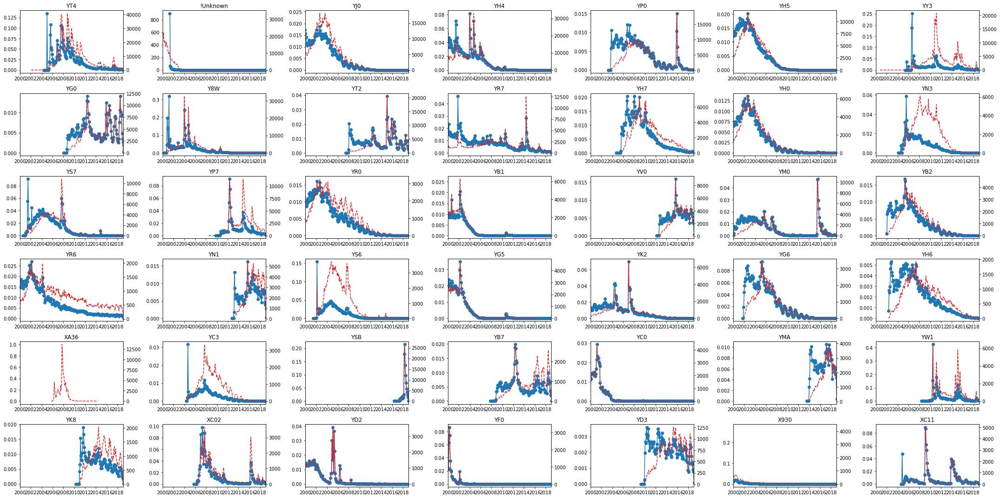

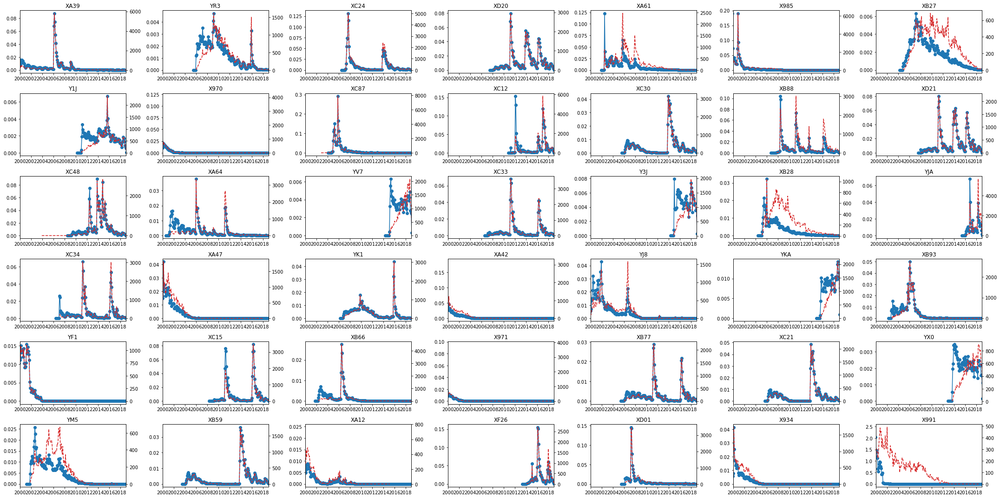

In [125]:
for k in range(0, 84, 42):
    print("===" * 100)
    fig = plt.figure(figsize=(30,15))
    for i, m in enumerate(model_top.index[k:k+42]):
        ax1 = fig.add_subplot(6,7,i+1)
        val1 = failure_ratio_monthly.loc[:, m]
        val2 = df_warranty_model_plot.loc[df_warranty_model_plot.PROD_CD == m,
                                         "N"]
        ax1.plot(val1.index, val1, "o-")
        ax1.set_title(m)
        ax1.set_xlim(datetime(2000,1,1),datetime(2018,12,31))

        ax2 = ax1.twinx()
        ax2.plot(val2.index, val2, "--", color="tab:red")
        ax2.set_xlim(datetime(2000,1,1),datetime(2018,12,31))

    plt.tight_layout()
    plt.show()

In [148]:
def month_passed(series, baseyear, basemonth):
    return 12 * (baseyear - series.dt.year) + (basemonth - series.dt.month)

In [149]:
models_running_passed = models_running.copy()
models_running_passed["MONTH"] = month_passed(models_running_passed.MONTH,
                                              2019, 3)

In [150]:
df_warranty_model_num_month_passed.head()

,PROD_CD,PASSED_MONTH,N
0,!Unknown,0,4898
1,!Unknown,1,12832
2,!Unknown,2,11731
3,!Unknown,3,10984
4,!Unknown,4,10123


In [151]:
models_failured_passed = (df_warranty_model_num_month_passed
                          .pivot_table(index="PASSED_MONTH",
                                       columns="PROD_CD",
                                      values="N"))
dp = pd.DataFrame({"PASSED_MONTH":list(range(299))})
models_failured_passed = dp.merge(models_failured_passed, on="PASSED_MONTH",
                                 how="left").fillna(0)

In [152]:
# モデルXの経過月Tでの故障割合 = モデルXの経過月Tでのワランティ数 / T月以上経過したモデルAの稼働台数 (<- 累積生産台数で近似)
failure_ratio_month_passed = models_failured_passed.set_index("PASSED_MONTH")\
    / models_running_passed.set_index("MONTH")

In [154]:
df_warranty_model_passed_plot = df_warranty_model_num_month_passed.copy()
df_warranty_model_passed_plot["PASSED_MONTH"] = df_warranty_model_passed_plot["PASSED_MONTH"].astype(int)
df_warranty_model_passed_plot = df_warranty_model_passed_plot.set_index("PASSED_MONTH")

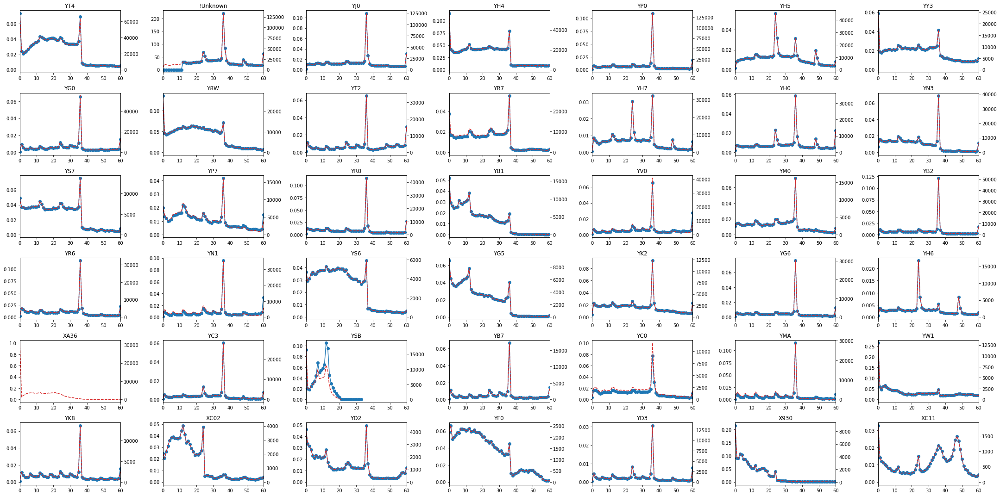

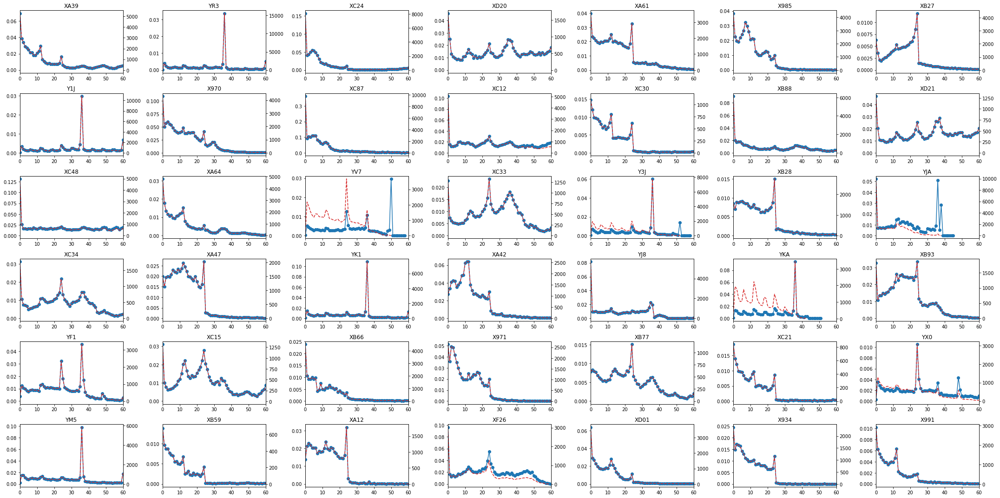

In [155]:
for k in range(0, 84, 42):
    print("===" * 100)
    fig = plt.figure(figsize=(30,15))
    for i, m in enumerate(model_top.index[k:k+42]):
        ax1 = fig.add_subplot(6,7,i+1)
        val1 = failure_ratio_month_passed.loc[:, m]
        val2 = df_warranty_model_passed_plot.loc[df_warranty_model_passed_plot.PROD_CD == m,
                                         "N"]
        ax1.plot(val1.index, val1, "o-")
        ax1.set_title(m)
        ax1.set_xlim(0, 60)

        ax2 = ax1.twinx()
        ax2.plot(val2.index, val2, "--", color="tab:red")
        ax2.set_xlim(0, 60)

    plt.tight_layout()
    plt.show()

In [248]:
parts_failured = (df_warranty_part_num_monthly
                  .pivot_table(index="MONTH", columns="PART_CD", values="N")
                  .reset_index())
parts_failured["MONTH"] = pd.to_datetime(parts_failured.MONTH + "01")
parts_failured = d.merge(parts_failured, on="MONTH", how="left").fillna(0)

In [287]:
model_parts_failured = (df_warranty_model_part_num_monthly
                  .pivot_table(index="MONTH", columns=["PROD_CD", "PART_CD"], values="N")
                  .reset_index(level="MONTH"))
model_parts_failured["MONTH"] = pd.to_datetime(model_parts_failured.MONTH + "01")

In [288]:
model_parts_failured.head()

PROD_CD      MONTH      AN40      BAND                          C540  \
PART_CD            32800-47H 32800-188 32800-18H 32800-478 37195-14G   
0       1992-11-01       NaN       NaN       NaN       NaN       NaN   
1       1993-01-01       NaN       NaN       NaN       NaN       NaN   
2       1993-10-01       NaN       NaN       NaN       NaN       NaN   
3       1994-01-01       NaN       NaN       NaN       NaN       NaN   
4       1994-05-01       NaN       NaN       NaN       NaN       NaN   

PROD_CD      C562      C582      C640      C869      C940      C947      CA12  \
PART_CD 37195-14G 990D0-39G 37195-14G 33610-32C 990D0-K49 990D0-ALA 33610-15D   
0             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4             NaN       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD      CA63      CB54      CB61      CB62                CB68      CB82  \
PART_CD 33610-32C 33610-02F 33610-32C 33610-26D 990D0-ALA 33610-17E 33610-17E   
0             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4             NaN       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD      CB94      CC47      CC62      CC68                          CD12  \
PART_CD 990D0-K33 990D0-ALA 990D0-ALA 990D0-11J 990D0-HBL 990D0-SC0 33610-15D   
0             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4             NaN       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD      CD55      CD62      CD68      DL10                                \
PART_CD 33610-26D 33610-26D 33610-26D 09283-060 09283-380 09402-285 15100-06G   
0             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4             NaN       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD                                                                        \
PART_CD 15420-05H 15420-35F 21200-31Y 23160-06G 32101-06G 32800-06G 32920-31J   
0             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4             NaN       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD                                                                        \
PART_CD 33610-26D 33970-47H 36600-318 38500-41F 48400-318 51153-44G 56500-04F   
0             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
4             NaN       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD                DL65  ...       YY3                                \
PART_CD 621

In [290]:
tmp_cols = model_parts_failured.columns
model_parts_failured.columns = ['_'.join(col).strip() 
                                for col 
                                in model_parts_failured.columns.values]

In [291]:
model_parts_failured.head()

,MONTH_,AN40_32800-47H,BAND_32800-188,BAND_32800-18H,BAND_32800-478,C540_37195-14G,C562_37195-14G,C582_990D0-39G,C640_37195-14G,C869_33610-32C,C940_990D0-K49,C947_990D0-ALA,CA12_33610-15D,CA63_33610-32C,CB54_33610-02F,CB61_33610-32C,CB62_33610-26D,CB62_990D0-ALA,CB68_33610-17E,CB82_33610-17E,CB94_990D0-K33,CC47_990D0-ALA,CC62_990D0-ALA,CC68_990D0-11J,CC68_990D0-HBL,CC68_990D0-SC0,CD12_33610-15D,CD55_33610-26D,CD62_33610-26D,CD68_33610-26D,DL10_09283-060,DL10_09283-380,DL10_09402-285,DL10_15100-06G,DL10_15420-05H,DL10_15420-35F,DL10_21200-31Y,DL10_23160-06G,DL10_32101-06G,DL10_32800-06G,DL10_32920-31J,DL10_33610-26D,DL10_33970-47H,DL10_36600-318,DL10_38500-41F,DL10_48400-318,DL10_51153-44G,DL10_56500-04F,DL10_62100-31J,DL65_11170-198,...,YY3_95861-80J,YY3_95891-50G,YY3_95891-60E,YY3_95894-50G,YY3_95895-50G,YY3_95895-84E,YY3_95896-50G,YY3_95897-54J,YY3_95951-80J,YY3_99000-22B,YY3_99000-251,YY3_99000-312,YY3_99000-320,YY3_99000-321,YY3_99000-85E,YY3_99000-990,YY3_99011-80J,YY3_990B0-010,YY3_990E0-62J,YY3_990E0-79J,YY3_990E0-80J,YY3_99414-021,YY3_99611-60A,YY3_99999-000,ZHE_09401-124,ZHE_11000-718,ZHE_14110-72L,ZHE_27431-54L,ZHE_27431-57L,ZHE_31400-71L,ZHE_33610-77E,ZHE_35320-72L,ZHE_37740-58M,ZHE_37950-62J,ZHE_38340-58M,ZHE_41602-70L,ZHE_41810-70L,ZHE_46500-72L,ZHE_48200-71L,ZHE_48580-588,ZHE_48580-71L,ZHE_49160-70A,ZHE_55860-688,ZHE_57300-71L,ZHE_57611-63J,ZHE_71711-58M,ZHE_75110-71L,ZHE_82110-68L,ZHE_84920-71L,ZHE_95200-68L
0,1992-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1993-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1993-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1994-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1994-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [295]:
model_parts_failured = d.merge(model_parts_failured\
                               .rename(columns={"MONTH_":"MONTH"}), 
                               on="MONTH", how="left").fillna(0)

In [299]:
model_parts_failured.columns = tmp_cols

In [300]:
model_parts_failured.head()

PROD_CD      MONTH      AN40      BAND                          C540  \
PART_CD            32800-47H 32800-188 32800-18H 32800-478 37195-14G   
0       1994-04-01       0.0       0.0       0.0       0.0       0.0   
1       1994-05-01       0.0       0.0       0.0       0.0       0.0   
2       1994-06-01       0.0       0.0       0.0       0.0       0.0   
3       1994-07-01       0.0       0.0       0.0       0.0       0.0   
4       1994-08-01       0.0       0.0       0.0       0.0       0.0   

PROD_CD      C562      C582      C640      C869      C940      C947      CA12  \
PART_CD 37195-14G 990D0-39G 37195-14G 33610-32C 990D0-K49 990D0-ALA 33610-15D   
0             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
1             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
2             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
3             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
4             0.0       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD      CA63      CB54      CB61      CB62                CB68      CB82  \
PART_CD 33610-32C 33610-02F 33610-32C 33610-26D 990D0-ALA 33610-17E 33610-17E   
0             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
1             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
2             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
3             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
4             0.0       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD      CB94      CC47      CC62      CC68                          CD12  \
PART_CD 990D0-K33 990D0-ALA 990D0-ALA 990D0-11J 990D0-HBL 990D0-SC0 33610-15D   
0             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
1             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
2             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
3             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
4             0.0       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD      CD55      CD62      CD68      DL10                                \
PART_CD 33610-26D 33610-26D 33610-26D 09283-060 09283-380 09402-285 15100-06G   
0             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
1             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
2             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
3             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
4             0.0       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD                                                                        \
PART_CD 15420-05H 15420-35F 21200-31Y 23160-06G 32101-06G 32800-06G 32920-31J   
0             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
1             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
2             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
3             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
4             0.0       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD                                                                        \
PART_CD 33610-26D 33970-47H 36600-318 38500-41F 48400-318 51153-44G 56500-04F   
0             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
1             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
2             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
3             0.0       0.0       0.0       0.0       0.0       0.0       0.0   
4             0.0       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD                DL65  ...       YY3                                \
PART_CD 621

In [302]:
model_parts_failured.set_index("MONTH").head()

PROD_CD         AN40      BAND                          C540      C562  \
PART_CD    32800-47H 32800-188 32800-18H 32800-478 37195-14G 37195-14G   
MONTH                                                                    
1994-04-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-05-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-06-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-07-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-08-01       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD         C582      C640      C869      C940      C947      CA12  \
PART_CD    990D0-39G 37195-14G 33610-32C 990D0-K49 990D0-ALA 33610-15D   
MONTH                                                                    
1994-04-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-05-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-06-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-07-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-08-01       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD         CA63      CB54      CB61      CB62                CB68  \
PART_CD    33610-32C 33610-02F 33610-32C 33610-26D 990D0-ALA 33610-17E   
MONTH                                                                    
1994-04-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-05-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-06-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-07-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-08-01       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD         CB82      CB94      CC47      CC62      CC68            \
PART_CD    33610-17E 990D0-K33 990D0-ALA 990D0-ALA 990D0-11J 990D0-HBL   
MONTH                                                                    
1994-04-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-05-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-06-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-07-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-08-01       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD                   CD12      CD55      CD62      CD68      DL10  \
PART_CD    990D0-SC0 33610-15D 33610-26D 33610-26D 33610-26D 09283-060   
MONTH                                                                    
1994-04-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-05-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-06-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-07-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-08-01       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD                                                                 \
PART_CD    09283-380 09402-285 15100-06G 15420-05H 15420-35F 21200-31Y   
MONTH                                                                    
1994-04-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-05-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-06-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-07-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-08-01       0.0       0.0       0.0       0.0       0.0       0.0   

PROD_CD                                                                 \
PART_CD    23160-06G 32101-06G 32800-06G 32920-31J 33610-26D 33970-47H   
MONTH                                                                    
1994-04-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-05-01       0.0       0.0       0.0       0.0       0.0       0.0   
1994-06-01       0.0       0.0       0.0       0.0       0.0       0.0  

In [310]:
model_parts_failured.columns.names

FrozenList(['PROD_CD', 'PART_CD'])

In [324]:
models_running.columns.names = ["PROD_CD"]

In [325]:
# モデルXのパーツxの当月故障割合 = モデルXのパーツxの当月ワランティ数 / モデルAの稼働台数 (<- 累積生産台数で近似)
failure_ratio_model_parts_monthly = model_parts_failured.set_index("MONTH")\
    / models_running.set_index("MONTH")

In [326]:
failure_ratio_model_parts_monthly.tail()

PROD_CD         AN40      BAND                          C540      C562  \
PART_CD    32800-47H 32800-188 32800-18H 32800-478 37195-14G 37195-14G   
MONTH                                                                    
2018-11-01       NaN       NaN       NaN       NaN       NaN       NaN   
2018-12-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-01-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-02-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-03-01       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD         C582      C640      C869      C940      C947      CA12  \
PART_CD    990D0-39G 37195-14G 33610-32C 990D0-K49 990D0-ALA 33610-15D   
MONTH                                                                    
2018-11-01       NaN       NaN       NaN       NaN       NaN       NaN   
2018-12-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-01-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-02-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-03-01       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD         CA63      CB54      CB61      CB62                CB68  \
PART_CD    33610-32C 33610-02F 33610-32C 33610-26D 990D0-ALA 33610-17E   
MONTH                                                                    
2018-11-01       NaN       NaN       NaN       NaN       NaN       NaN   
2018-12-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-01-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-02-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-03-01       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD         CB82      CB94      CC47      CC62      CC68            \
PART_CD    33610-17E 990D0-K33 990D0-ALA 990D0-ALA 990D0-11J 990D0-HBL   
MONTH                                                                    
2018-11-01       NaN       NaN       NaN       NaN       NaN       NaN   
2018-12-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-01-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-02-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-03-01       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD                   CD12      CD55      CD62      CD68      DL10  \
PART_CD    990D0-SC0 33610-15D 33610-26D 33610-26D 33610-26D 09283-060   
MONTH                                                                    
2018-11-01       NaN       NaN       NaN       NaN       NaN       NaN   
2018-12-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-01-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-02-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-03-01       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD                                                                 \
PART_CD    09283-380 09402-285 15100-06G 15420-05H 15420-35F 21200-31Y   
MONTH                                                                    
2018-11-01       NaN       NaN       NaN       NaN       NaN       NaN   
2018-12-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-01-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-02-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-03-01       NaN       NaN       NaN       NaN       NaN       NaN   

PROD_CD                                                                 \
PART_CD    23160-06G 32101-06G 32800-06G 32920-31J 33610-26D 33970-47H   
MONTH                                                                    
2018-11-01       NaN       NaN       NaN       NaN       NaN       NaN   
2018-12-01       NaN       NaN       NaN       NaN       NaN       NaN   
2019-01-01       NaN       NaN       NaN       NaN       NaN       NaN  

In [334]:
failure_ratio_model_parts_monthly.columns = ['_'.join(col).strip() 
                                for col 
                                in failure_ratio_model_parts_monthly.columns.values]

In [335]:
failure_ratio_model_parts_monthly\
        .reset_index()\
        .to_feather(PATH_INTERIM_DATA/"failure_ratio_model_parts_monthly.feather")

In [ ]:
# パーツxの当月故障割合 = パーツxの当月ワランティ数 / パーツxを含むモデルA,B,...の稼働台数 (<- 累積生産台数で近似)

In [78]:
failure_ratio_all = (df_fcok_model_num_all
                     .merge(right=df_warranty_model_num_all,
                       on = "PROD_CD", how="left")
                     .rename(columns={"N_x":"fcok", "N_y":"warranty"}))
failure_ratio_all["failure_ratio"] = failure_ratio_all["warranty"] / \
    failure_ratio_all["fcok"]

In [ ]:
c

(array([0.15936255, 0.20318725, 0.187251  , 0.06772908, 0.09561753,
        0.09960159, 0.05179283, 0.05577689, 0.05179283, 0.02788845]),
 array([1.86950832e-04, 9.87566284e-02, 1.97326306e-01, 2.95895984e-01,
        3.94465661e-01, 4.93035339e-01, 5.91605016e-01, 6.90174694e-01,
        7.88744372e-01, 8.87314049e-01, 9.85883727e-01]),
 <a list of 10 Patch objects>)

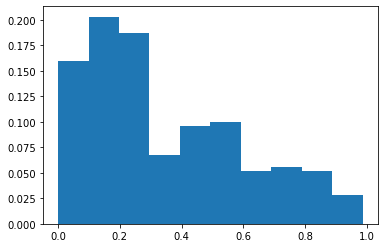

In [91]:
import matplotlib.pyplot as plt
import numpy as np

val = failure_ratio_all.loc[failure_ratio_all.failure_ratio < 1, "failure_ratio"].values
weights = np.ones(len(val))/float(len(val))
plt.hist(val, weights=weights )

In [96]:
failure_ratio_all[failure_ratio_all.failure_ratio < 1]\
    .sort_values(by="warranty", ascending=False)

,PROD_CD,fcok,warranty,failure_ratio
316,YJ0,1150068,1011300.0,0.879339
345,YP0,1231594,676273.0,0.549104
313,YH5,804263,595215.0,0.740075
306,YG0,846461,518814.0,0.612921
359,YT2,522187,431510.0,0.826351
350,YR7,556086,402505.0,0.723818
315,YH7,952660,374668.0,0.393286
311,YH0,588366,331117.0,0.562774
343,YN3,566537,327504.0,0.578081
346,YP7,411605,261158.0,0.634487


In [ ]:
# 累積生産台数


In [ ]:
# 暦月で見た時の故障率P_{モデル、パーツ、暦月}を計算


In [ ]:
# 購入からの経過月で見たときの故障率P_{モデル、パーツ、経過月}を計算

In [111]:
287073 * 12 * 20

68897520

In [113]:
100 * 12 * 20

24000

In [90]:
df_caover_ratio_gathered = df_cover_ratio.copy()

In [ ]:
df_cover_ratio_gathered["W_PROD_MODEL_CD"] = \
    df_cover_ratio_gathered["W_PROD_MODEL_CD"].str[:]